# Load Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Read in Images and Labels

In [2]:
# read labels for aircraft images
labels = pd.read_csv('aircraft.csv')
print(labels.head())
print(labels.shape)

                  imageName       ylabel  plane helicopter  other aircraft
0  2016-10-23T10+40+20_430Z  No aircraft  False      False  False    False
1  2016-11-26T20+15+55_250Z  No aircraft  False      False  False    False
2  2016-12-15T15+26+33_480Z  No aircraft  False      False  False    False
3  2016-10-23T14+01+49_396Z  No aircraft  False      False  False    False
4  2016-08-14T05+43+34_690Z  No aircraft  False      False  False    False
(2410, 6)


In [3]:
# create list of images that contain aircraft
aircraft = labels[labels['aircraft']==True]['imageName']
print(aircraft.shape)
print(type(aircraft))

(47,)
<class 'pandas.core.series.Series'>


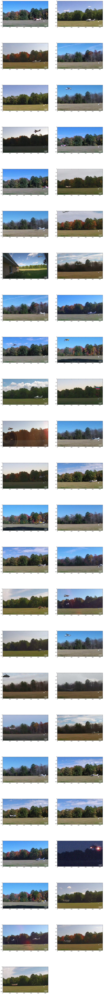

In [4]:
# view images stored in '/All_images' subdirectory
from skimage import io

plt.rcParams['figure.figsize'] = (20.0, 200.0)
f, axarr = plt.subplots(24, 2)

rownow = 0
colnow = 0
i = 0

for craft in aircraft:
    if i < aircraft.shape[0]:
        if colnow == 0:
            toRead = 'All_images/' + craft
            axarr[rownow, colnow].imshow(io.imread(toRead))
            colnow = 1
            i = i + 1
            if i == aircraft.shape[0]:
                axarr[-1, -1].axis('off')
        elif colnow == 1:
            toRead = 'All_images/' + craft
            axarr[rownow, colnow].imshow(io.imread(toRead))
            colnow = 0
            rownow = rownow + 1
            i = i + 1

# Extract all Images into greyscale

In [5]:
#function to extract all images into black and white
import os
from scipy import ndimage
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder)[0:len(os.listdir(folder))]:
        img = ndimage.imread(os.path.join(folder,filename), flatten = True)/255
        #img = ndimage.imread(os.path.join(folder,filename), flatten = False)/255
        #img = array(Image.open(os.path.join(folder,filename)).convert('L'))/255
        if img is not None:
            images.append(img)
    return images

In [6]:
imgs = load_images_from_folder('All_images/')

# Change Image vector into Features

In [7]:
#Spread out arrays into 1D vectors
imgs_flat = []
for i in range(0, len(imgs)):
    imgs_flat.append(np.ravel(imgs[i]))

# Ready Data for Modeling and Evaluation

In [8]:
#Aaron Hill's Binary Classification Evaluator
class BinaryClassificationPerformance():
    '''Performance measures to evaluate the fit of a binary classification model'''
    
    def __init__(self, predictions, labels, desc, probabilities=None):
        '''Initialize attributes: predictions-vector of predicted values for Y, labels-vector of labels for Y'''
        '''probabilities-optional, probability that Y is equal to True'''
        self.probabilities = probabilities
        self.performance_df = pd.concat([pd.DataFrame(predictions), pd.DataFrame(labels)], axis=1)
        self.performance_df.columns = ['preds', 'labls']
        self.desc = desc
        self.performance_measures = {}
  
    def compute_measures(self):
        '''Compute performance measures defined by Flach p. 57'''
        self.performance_measures['Pos'] = self.performance_df['preds'].sum()
        self.performance_measures['Neg'] = self.performance_df.shape[0] - self.performance_df['preds'].sum()
        self.performance_measures['TP'] = ((self.performance_df['preds'] == True) & (self.performance_df['labls'] == True)).sum()
        self.performance_measures['TN'] = ((self.performance_df['preds'] == False) & (self.performance_df['labls'] == False)).sum()
        self.performance_measures['FP'] = ((self.performance_df['preds'] == True) & (self.performance_df['labls'] == False)).sum()
        self.performance_measures['FN'] = ((self.performance_df['preds'] == False) & (self.performance_df['labls'] == True)).sum()
        self.performance_measures['Accuracy'] = (self.performance_measures['TP'] + self.performance_measures['TN']) / (self.performance_measures['Pos'] + self.performance_measures['Neg'])

In [9]:
#Separate out train and test sets
from sklearn.cross_validation import train_test_split

data_train, data_test, y_train, y_test = train_test_split(imgs_flat, labels['aircraft'],
                                                          test_size = 0.5,
                                                          random_state = 56)

C:\Users\Julian Bautista\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


# Test Models

In [11]:
#allow pickle loading
from sklearn.externals import joblib

In [12]:
#Try SVM
svm = joblib.load('svm.pkl')

svm_performance = BinaryClassificationPerformance(svm.predict(data_train), y_train, 'svm')
svm_performance.compute_measures()
print(svm_performance.performance_measures)

{'TN': 596, 'Accuracy': 0.33074361820199777, 'TP': 0, 'FP': 0, 'Pos': 0, 'Neg': 1802, 'FN': 12}
